In [9]:
import numpy as np
import PIL
import cv2
import matplotlib
from matplotlib import pyplot
from PIL import Image


# Q1
### 1.1

Aspect ratio is 4:3.
Thus let's take the height as 3x and width as 4x.

Now the image is 8-bit and it has 3 colours. Thus 3x8 = 24 bits/pixel.

Total no. of pixels = $12 x^2$.

Total no. of bits = 24 x $12 x^2$.

But given image size is 5.76 MB.

Thus total number of bits = 5760000 x 8

$5760000 * 8 = 24 * 12 x^2$

x = 400

width = 4x = 1600.

height = 3x = 1200.

### 1.2

Total No. of pixels = $5200 * 5200$

No. of bits in 1 memory card = $64 * 10^9 *8 = 512*10^9$

### a

Number of bits per pixel = 1

Total no. of bits in 1 image= $5200 * 5200 * 1$

Images in memory card = $floor(bits in 1 memory card / bits in 1 image) = floor(512*10^9/5200*5200) = 18394$

No. of memory cards required = $ceil(2000/Images in one memory card) = ceil(2000/18394) = 1$

### b
Number of bits per pixel = 8

Total no. of bits in 1 image= $5200 * 5200 * 8$

Images in memory card = $floor(bits in 1 memory card / bits in 1 image) = floor(512*10^9/5200*5200*8) = 2366$

No. of memory cards required = $ceil(2000/Images in one memory card) = ceil(2000/2366) = 1$

### c
Number of bits per pixel = $8 * 3$ = 24

Total no. of bits in 1 image= $5200 * 5200 * 24$

Images in memory card = $floor(bits in 1 memory card / bits in 1 image) = floor(512*10^9/5200*5200*24) = 788$

No. of memory cards required = $ceil(2000/Images in one memory card) = ceil(2000/788) = 3$

### 1.3

The resolution of the images are same which means that the number of pixels is same. But we are changing the screen size. So when we move from a smaller screen to a larger one the pixels expand and the size of pixels will increase so the image would be less clearer.


# Q2

### 2.1

In [88]:
from itertools import count
from PIL import Image


def most_frequentcolor(img):
   
   

    [hei, wid, channels] = np.shape(img)

  
    r = 0
    g = 0
    b = 0

    count = {}

    # Iterate through each pixel
    for x in range(0, hei):
        for y in range(0, wid):
            if(count.__contains__(tuple(img[x][y]))):
                count[tuple(img[x][y])]+=1
            else :
                count[tuple(img[x][y])] = 1

    ma = -1
    for keys in count :
        if(count[keys] > ma):
            ma = count[keys]
            ans = keys
    return ans            



In [89]:


var = cv2.imread("../imgs/pepper.jpg")

b, g, r = cv2.split(var)       # get b,g,r
rgb_img = cv2.merge([r, g, b])



# call function
freq_color = most_frequentcolor(rgb_img)

print(freq_color)


(254, 218, 0)


### 2.2

In [90]:
def mergeImage(img1, img2):

    [hei1, wid1, channels1] = np.shape(img1)
    [hei2, wid2, channels2] = np.shape(img2)

    r = 0
    g = 0
    b = 0

    count = {}

    # Iterate through each pixel
    for x in range(0, hei1):
        for y in range(0, wid1):
            #if(not np.array_equal(img1[x][y],[0,255,0])):
            if(np.linalg.norm([0,255,0] - img1[x][y])>200):
                img2[x][y] = img1[x][y]
    
    return img2



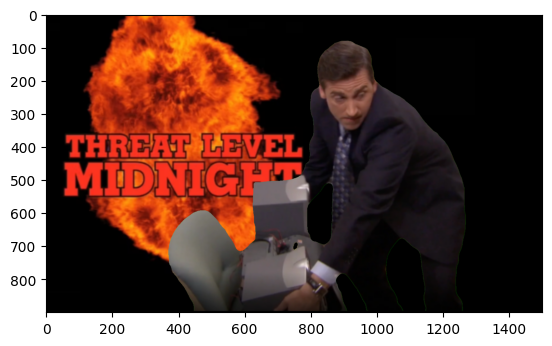

In [92]:


background_bgr = cv2.imread("../imgs/background.png")
foreground_bgr = cv2.imread("../imgs/foreground.png")
b, g, r = cv2.split(background_bgr)       # get b,g,r
background_rgb = cv2.merge([r, g, b])
b, g, r = cv2.split(foreground_bgr)       # get b,g,r
foreground_rgb = cv2.merge([r, g, b])

outImage = mergeImage(foreground_rgb,background_rgb)

# Display image
pyplot.imshow(outImage)
pyplot.show()
# background.paste(foreground, (0, 0), foreground)
# background.show()


# Q3

### Part 1 

In [93]:
def piecewiseLinTransform(img,coeff,limits) :
    #img = img.astype(np.float64)
    [hei, wid] = np.shape(img)
    mask = np.zeros(img.shape)
    for x in range(0, hei):
        for y in range(0, wid):
            for i in range(len(coeff)):
        
                if(img[x][y]>=limits[i][0]) and (img[x][y]<=limits[i][1]):
                    mask[x][y] =  (coeff[i][0] * img[x][y]) + (coeff[i][1])
    return mask.astype(np.uint8)



In [94]:
def coefficients(x,a,y,b):
    x *=255
    a *=255
    y *=255
    b *=255
    num = b-y
    num*=1.0
    m = num/(a-x)
    c = y-(m*x)
    return [m,c]



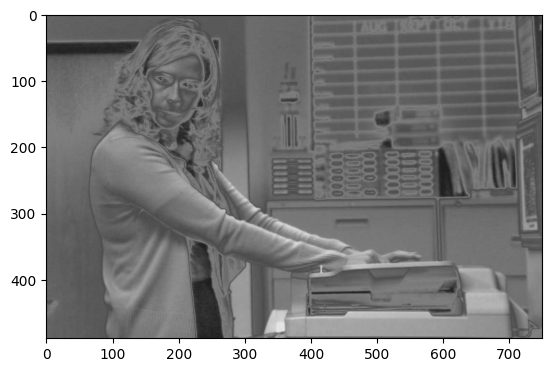

In [96]:
img = cv2.imread("../imgs/pam1.png",cv2.IMREAD_GRAYSCALE)



result = (piecewiseLinTransform(img, [coefficients(0, 0.2, 0.1, 0.5), coefficients(0.2, 0.4, 0.5, 0.3), coefficients(0.4, 1, 0.3, 0.9)],[[0,0.2*255],[0.2*255,0.4*255],[0.4*255,1*255]]))

pyplot.imshow(result,cmap="gray",vmin=0,vmax=255)
pyplot.show()


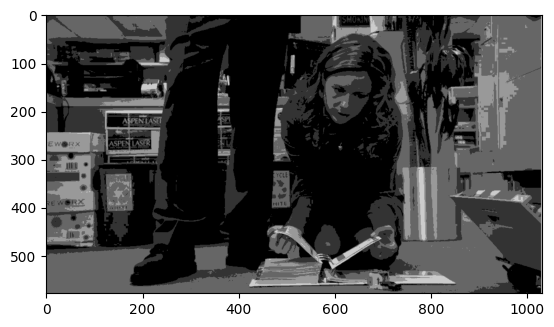

In [98]:
img = cv2.imread("../imgs/pam2.png", cv2.IMREAD_GRAYSCALE)


result = (piecewiseLinTransform(img, [coefficients(0, 0.2, 0, 0), coefficients(0.2, 0.4, 0.2, 0.2), coefficients(
    0.4, 0.6, 0.4, 0.4), coefficients(0.6, 0.8, 0.6, 0.6), coefficients(0.8, 1, 0.8, 0.8)], [[0, 0.2*255], [0.2*255, 0.4*255], [0.4*255, 0.6*255], [0.6*255, 0.8*255], [0.8*255, 1*255]]))

pyplot.imshow(result, cmap="gray", vmin=0, vmax=255)
pyplot.show()


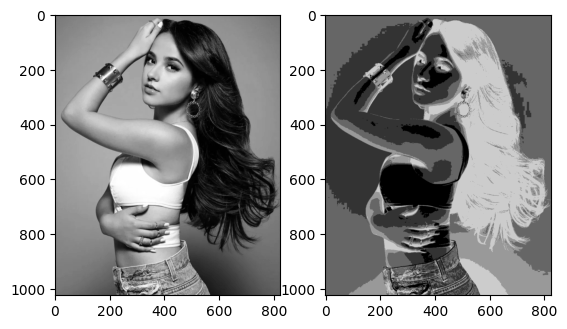

In [99]:
img = cv2.imread("../imgs/Naomi.png", cv2.IMREAD_GRAYSCALE)


result = (piecewiseLinTransform(img, [coefficients(0, 0.2, 0.8, 0.8), coefficients(0.2, 0.4, 0.6, 0.6), coefficients(
    0.4, 0.6, 0.4, 0.4), coefficients(0.6, 0.8, 0.2, 0.2), coefficients(0.8, 1, 0, 0)], [[0, 0.2*255], [0.2*255, 0.4*255], [0.4*255, 0.6*255], [0.6*255, 0.8*255], [0.8*255, 1*255]]))
pyplot.subplot(1,2,1)
pyplot.imshow(img, cmap="gray", vmin=0, vmax=255)
pyplot.subplot(1,2,2)
pyplot.imshow(result, cmap="gray", vmin=0, vmax=255)

pyplot.show()




# Q4

### Part 1

In [100]:
def bitSlice(img,k) :
    return (img >> (k-1))&1
### 8 is MSB


### Part 2


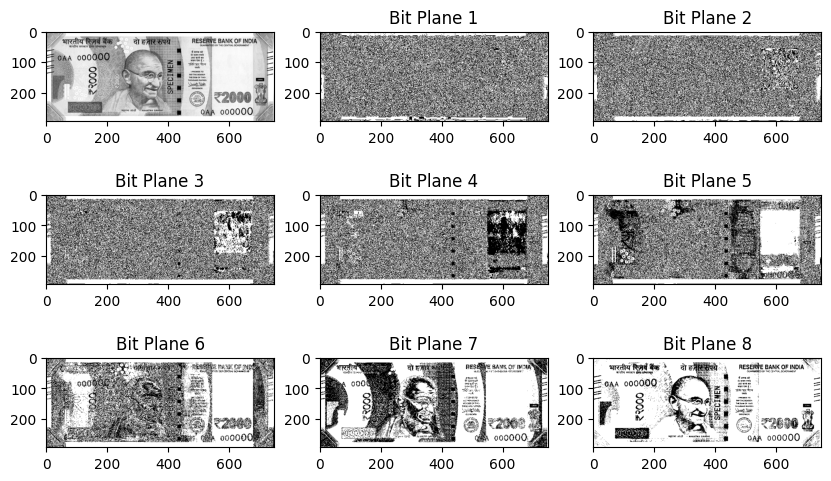

In [101]:
img = cv2.imread("../imgs/rupee.jpg", cv2.IMREAD_GRAYSCALE)

x = 2;
pyplot.figure(figsize = [10,6])
pyplot.subplot(3,3,1)
pyplot.imshow(img, cmap="gray", vmin=0, vmax=255)

for i in range(1,9): #since right limit is exclusive
    outimg = bitSlice(img, i)
    pyplot.subplot(3,3,x)
    pyplot.imshow(outimg, cmap="gray", vmin=0, vmax=1)
    pyplot.title("Bit Plane "+str(x-1))
    x+=1



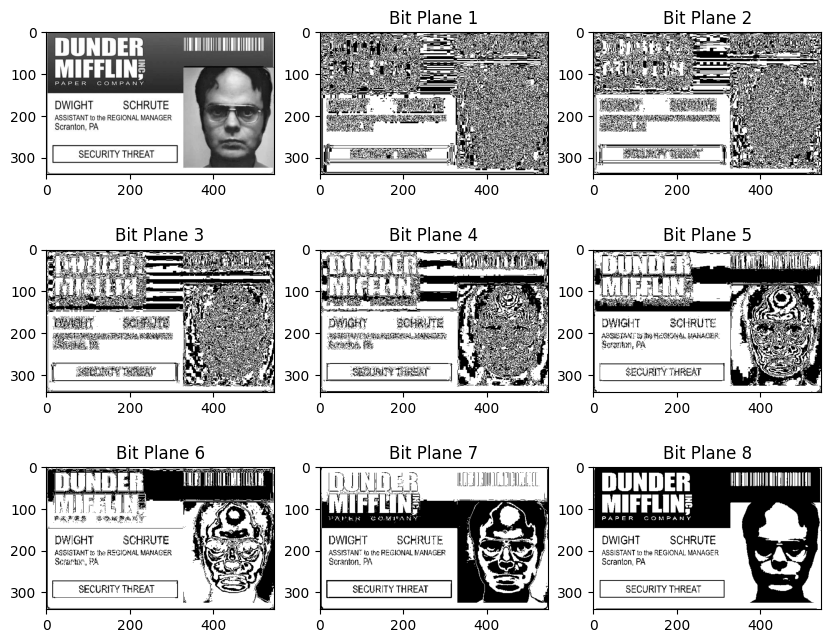

In [102]:
img = cv2.imread("../imgs/securityThreat.jpg", cv2.IMREAD_GRAYSCALE)

x = 2
pyplot.figure(figsize=[10, 8])
pyplot.subplot(3, 3, 1)
pyplot.imshow(img, cmap="gray", vmin=0, vmax=255)

for i in range(1, 9):  # since right limit is exclusive
    outimg = bitSlice(img, i)
    pyplot.subplot(3, 3, x)
    pyplot.imshow(outimg, cmap="gray", vmin=0, vmax=1)
    pyplot.title("Bit Plane "+str(x-1))
    x += 1


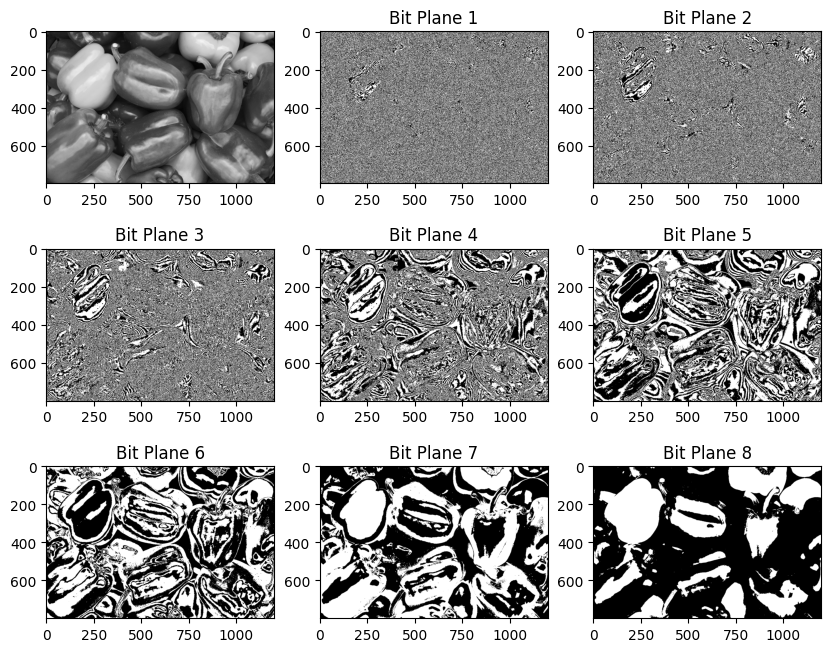

In [103]:
img = cv2.imread("../imgs/pepper.jpg", cv2.IMREAD_GRAYSCALE)

x = 2
pyplot.figure(figsize=[10, 8])
pyplot.subplot(3, 3, 1)
pyplot.imshow(img, cmap="gray", vmin=0, vmax=255)

for i in range(1, 9):  # since right limit is exclusive
    outimg = bitSlice(img, i)
    pyplot.subplot(3, 3, x)
    pyplot.imshow(outimg, cmap="gray", vmin=0, vmax=1)
    pyplot.title("Bit Plane "+str(x-1))
    x += 1


### 4.3


In [104]:
def imgBitQuantizer(img,k):
    out = np.zeros(img.shape)
    x=1
    for i in range(9-k,9):
        res = bitSlice(img,i)
        res = res.astype(int)
        res*=x
        x*=2
        out = np.add(out,res)
    return out



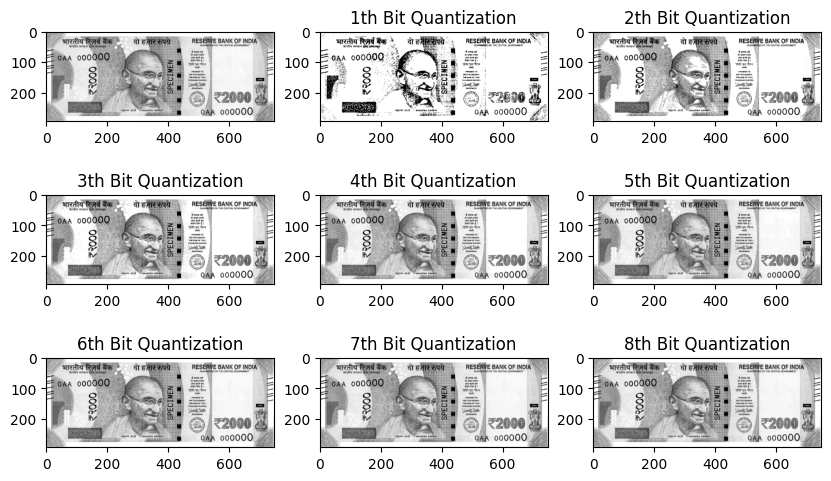

In [105]:
img = cv2.imread("../imgs/rupee.jpg",cv2.IMREAD_GRAYSCALE)


x = 2
pyplot.figure(figsize=[10, 6])
pyplot.subplot(3, 3, 1)
pyplot.imshow(img, cmap="gray", vmin=0, vmax=255)


for i in range(1,9):
    resimg = imgBitQuantizer(img,i)
    #resimg = resimg.astype(np.uint8)
    pyplot.subplot(3, 3, x)
    pyplot.imshow(resimg, cmap="gray")
    pyplot.title(str(i)+"th Bit Quantization")
    x+=1


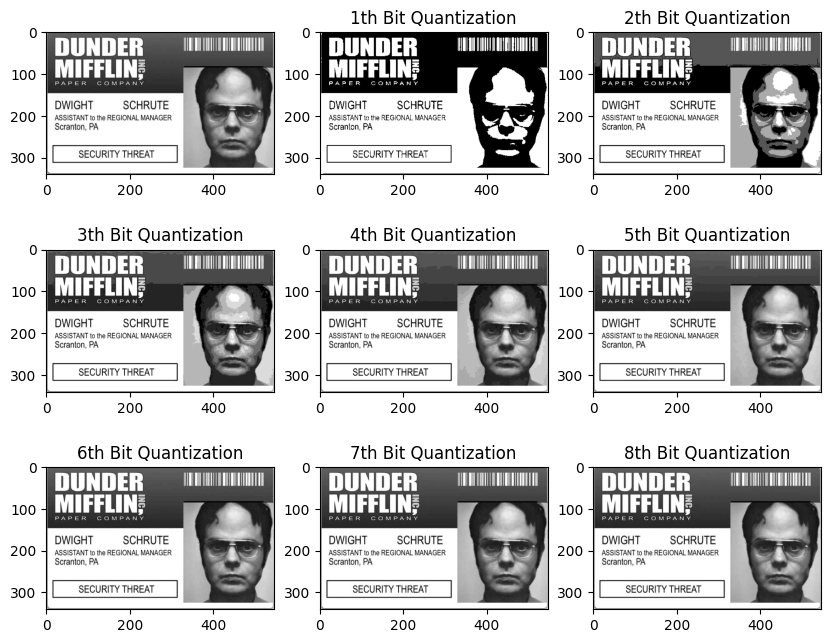

In [106]:
img = cv2.imread("../imgs/securityThreat.jpg", cv2.IMREAD_GRAYSCALE)


x = 2
pyplot.figure(figsize=[10, 8])
pyplot.subplot(3, 3, 1)
pyplot.imshow(img, cmap="gray", vmin=0, vmax=255)


for i in range(1, 9):
    resimg = imgBitQuantizer(img, i)
    #resimg = resimg.astype(np.uint8)
    pyplot.subplot(3, 3, x)
    pyplot.imshow(resimg, cmap="gray")
    pyplot.title(str(i)+"th Bit Quantization")
    x += 1


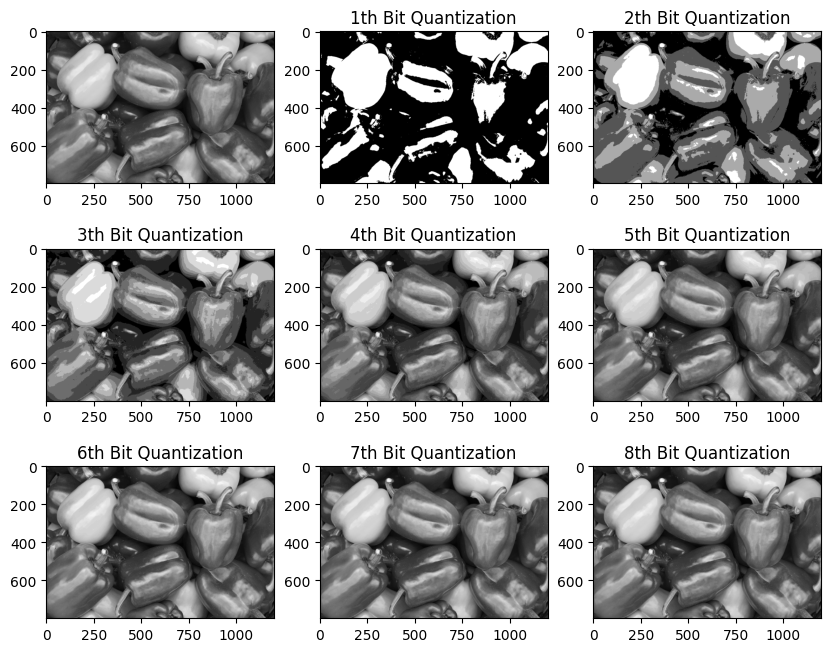

In [107]:
img = cv2.imread("../imgs/pepper.jpg", cv2.IMREAD_GRAYSCALE)


x = 2
pyplot.figure(figsize=[10, 8])
pyplot.subplot(3, 3, 1)
pyplot.imshow(img, cmap="gray", vmin=0, vmax=255)


for i in range(1, 9):
    resimg = imgBitQuantizer(img, i)
    #resimg = resimg.astype(np.uint8)
    pyplot.subplot(3, 3, x)
    pyplot.imshow(resimg, cmap="gray")
    pyplot.title(str(i)+"th Bit Quantization")
    x += 1


### Part 4.4
We observe from the plots in 4.2, that the bits closer to the LSB mostly carry static noise while other bits closer to MSB carry information that looks very similar to the image. 
We observe from the plots in 4.4 that images that have been quantized to 5-7 bits look similar to the original ones. We also notice that :
* image quantized to 8 bits is superposition of all 8 bitslices,
* image quantized to 7 bits is supeposition of the 7 most significant bit slices and so on...

### Part 4.5
Bit plane slicing can be used in image compression.

This is because we can get nearly similar images by using some bits closer to the MSB so we can neglect the other bits which helps us in compressing the image remarkably.

# Q5

### Part 1

#### a)
The range of acceptable values for $\gamma$ are all positive values.

#### b)
No. Since the function is exponential in nature, after a relatively small gamma, for $r > 1$, the value of $s$ will cross $255$. 
This can be resolved by taking $c$ as self adjusting. It depemds upon the value of $\gamma$. So, since r takes a max value of $255$, to be on the safe side, we can take $c = 255^{1-\gamma}$.

#### c)
If $\gamma < 1$ and it decreases the brightness of the image increases.
If $\gamma = 1$ it is unchanged.
If $\gamma > 1$ and $\gamma$ increases then the brightness decreases.

### Part 2

In [108]:
def powerLawTransform(img,gamma):
    c = 255**(1-gamma)
    [hei,wid,con]= np.shape(img)
    out = np.zeros(img.shape).astype(int)
    for x in range(1,hei):
        for y in range(1,wid):
            out[x][y] = (img[x][y]**gamma)*c
    # return (255**(1-gamma)*(img**gamma))
    return out

### Part 3

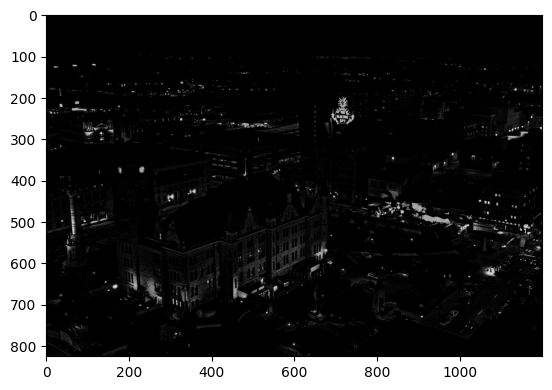

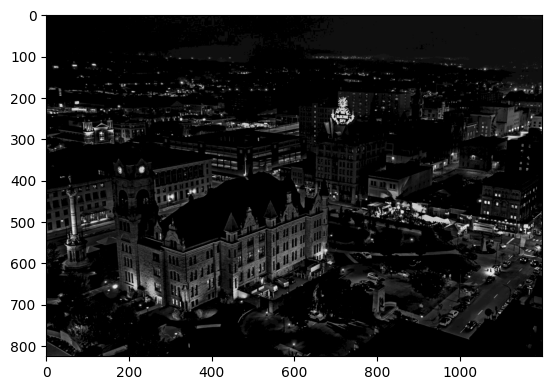

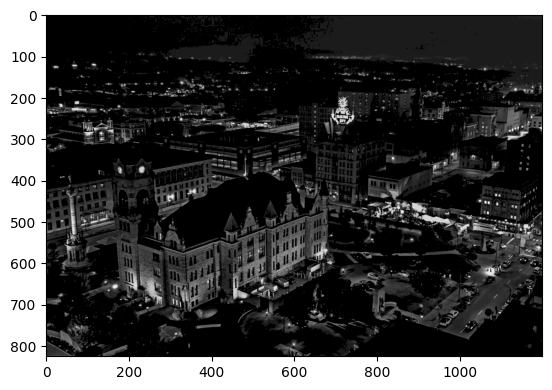

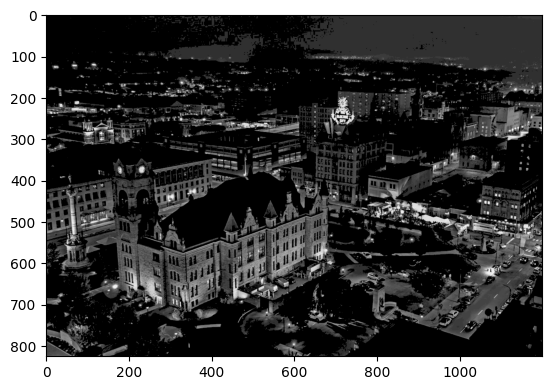

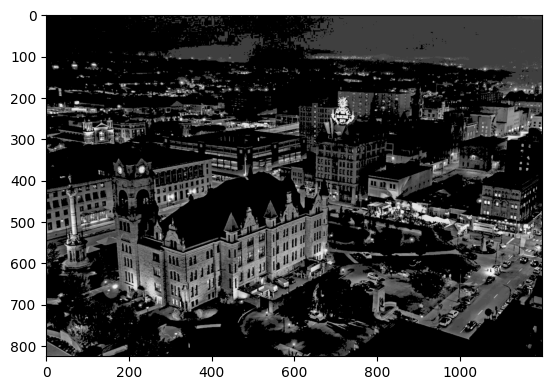

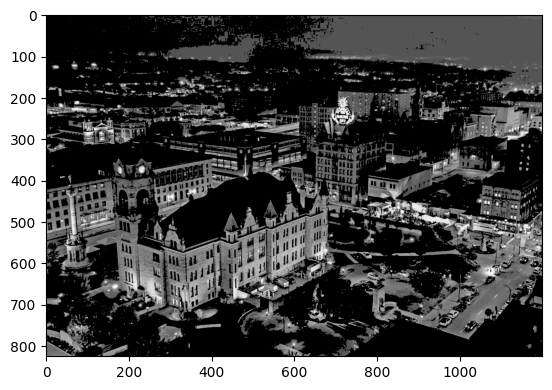

In [109]:
img = cv2.imread("../imgs/scrantonAreal.png")
#img.astype(int)
pyplot.imshow(img)
pyplot.show()
gamma = [0.5, 0.4, 0.3, 0.25, 0.2]  #
for i in range(len(gamma)):
    res = powerLawTransform(img,gamma[i])
    pyplot.imshow(res)
    pyplot.show()


As the value of gamma decreases enhancement increases


The value we requiere to get the original image is roughly $0.25$

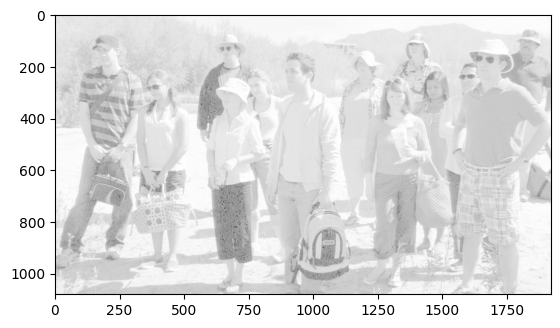

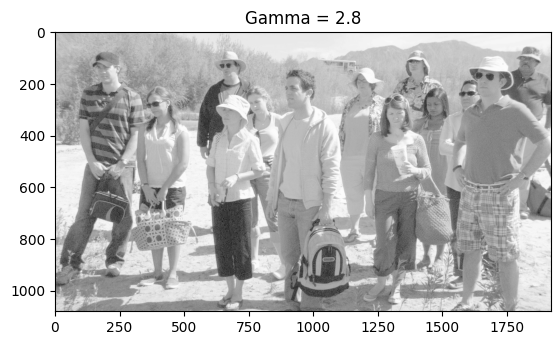

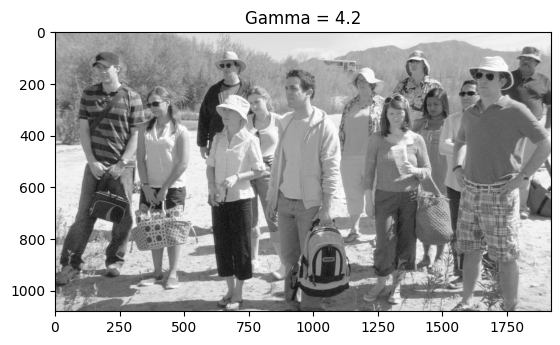

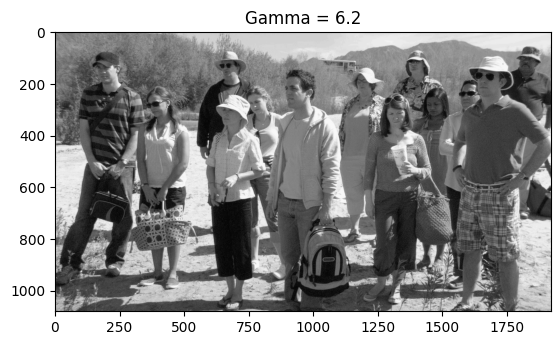

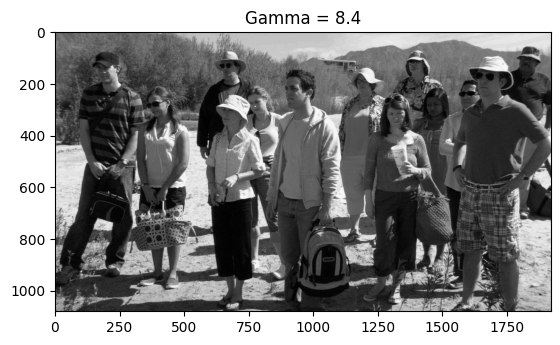

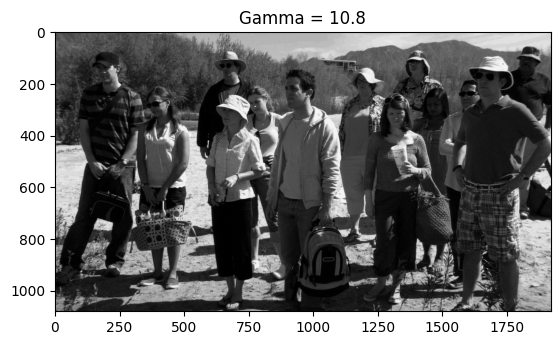

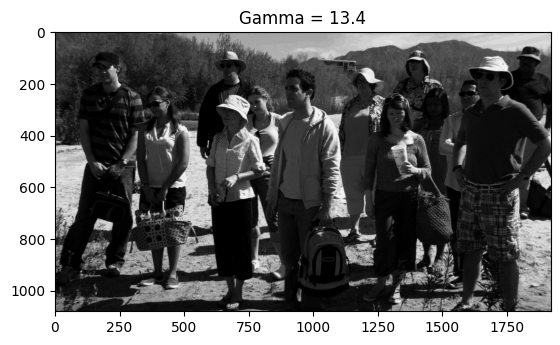

In [110]:
img = cv2.imread("../imgs/tripGrpPhoto.png")
#img.astype(int)
pyplot.imshow(img)
pyplot.show()
gamma = [2.8,4.2,6.2,8.4,10.8,13.4]
for i in range(len(gamma)):
    res = powerLawTransform(img, gamma[i])
    pyplot.imshow(res)
    pyplot.title("Gamma = "+str(gamma[i]))
    pyplot.show()


When $\gamma > 1$ and as the value of gamma increases image darkens.

### Part 3
Logarithmic tranform :$s = c*log(1+r)$ where r is the original intensity, s is the modified intensity and c is the constant term. c is a self-adjusting constant whose value equals $(L-1)/(\log(L))$.

In [122]:
from cmath import log


def logtransform(img):
    c = (float)(255/np.log(256))
    [hei,wid]= np.shape(img)
    out = np.zeros(img.shape).astype(int)
    for x in range(1,hei):
        for y in range(1,wid):
            out[x][y] = (np.log(1+img[x][y]))*c
    # return (255**(1-gamma)*(img**gamma))
    return out.astype(int)

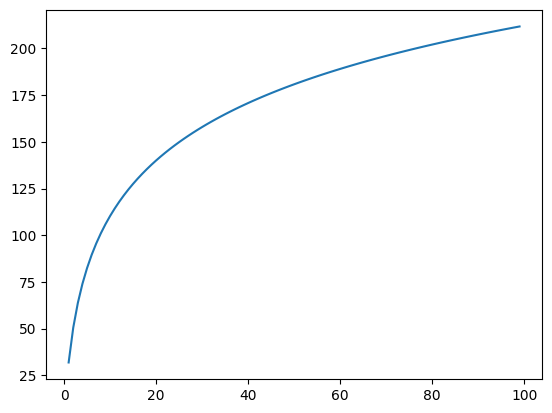

In [136]:
y = []
x = 255
x = range(1, 100)
y = [(255/np.log(256))*log(xi+1) for xi in x]


pyplot.plot(x,np.abs(y))
pyplot.show()

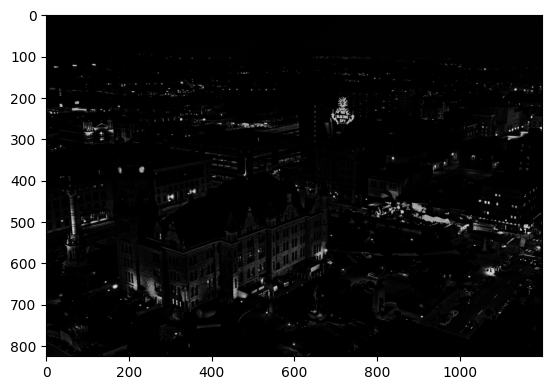

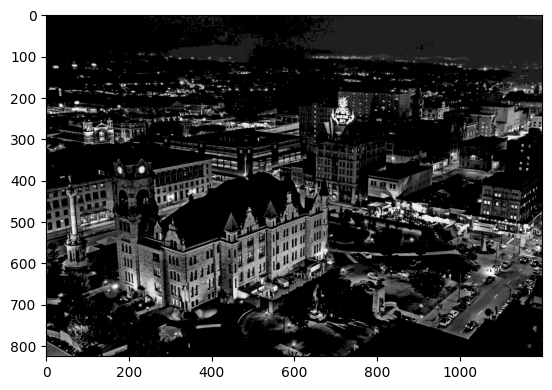

In [123]:
img = cv2.imread("../imgs/scrantonAreal.png",cv2.IMREAD_GRAYSCALE)
#img.astype(int)
pyplot.imshow(img, cmap="gray", vmin=0, vmax=255)
pyplot.show()

res = logtransform(img)
pyplot.imshow(res,cmap="gray",vmin=0,vmax=255)
pyplot.show()


We observe that the log transform has more brightness at regions which have stronger intensity. Log transform is more restricted. Since the power law transform includes the involvement of $\gamma$, the function can adapt depending on the value of $\gamma$, and can be used on a variety of plots. Depending upon $\gamma$, power law transform can either darken or brighten the image, while, log transform can mainly only be used to brighten the image. 

Power law transform is more feasible and can be used widely as compared to log transform

# Q6

### Part 1

In [127]:
def makehist(img):
    histogram_inp = np.zeros(256)
    for i in img:
        for j in i:
            histogram_inp[j]+=1
    return histogram_inp

In [128]:
def histEqual(img,L):
    size = img.shape[0]*img.shape[1]
    hei = img.shape[0]
    wid = img.shape[1]
    out = np.zeros(img.shape).astype(int)
    values = np.zeros(256)
   # cumiliative_prob = np.zeros(256).astype(int)
    histogram = makehist(img)
    values[0] = histogram[0]
    pre = 0
    for i in range(1 , 256):
        pre+=histogram[i]
        values[i] = np.round((255*(pre))/size)
    out = values[img]
    return out.astype(int)


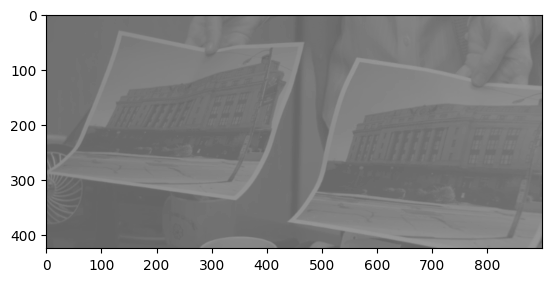

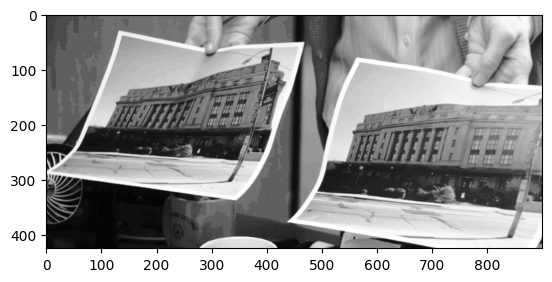

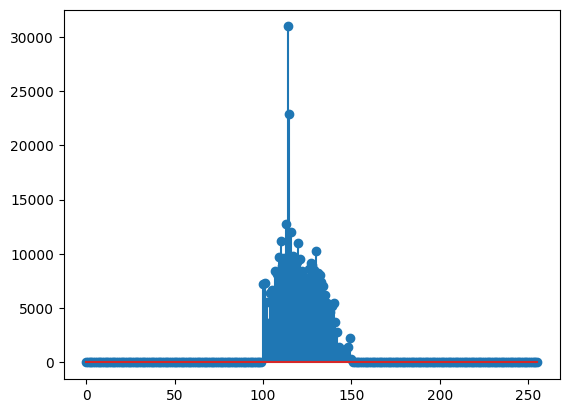

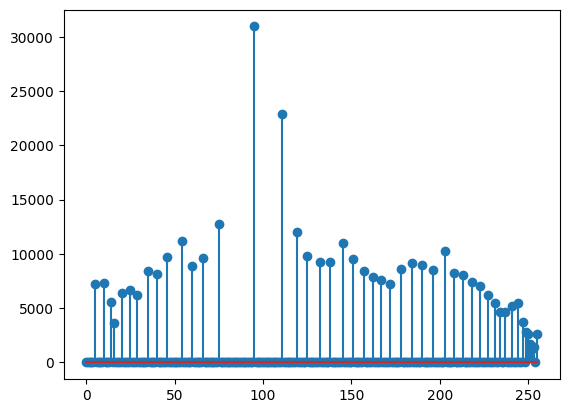

In [129]:
img = cv2.imread("../imgs/Same_picture.png",cv2.IMREAD_GRAYSCALE)
in_hist = makehist(img)
pyplot.imshow(img, cmap="gray",vmin=0,vmax=255)
pyplot.show()
L= 256
res = histEqual(img,L)
out_hist = makehist(res)
pyplot.imshow(res, cmap="gray", vmin=0, vmax=255)
pyplot.show()

pyplot.stem(in_hist)
pyplot.show()
pyplot.stem(out_hist)
pyplot.show()


In [130]:
def histmatch(img,ref):
    img_size = img.shape[0]*img.shape[1]
    img_hei = img.shape[0]
    img_wid = img.shape[1]
    ref_size = ref.shape[0]*ref.shape[1]
    ref_hei = ref.shape[0]
    ref_wid = ref.shape[1]
    out = np.zeros(img.shape).astype(int)
    values = np.zeros(256)
   # cumiliative_prob = np.zeros(256).astype(int)
    inp_histogram = makehist(img)
    ref_histogram = makehist(ref)
    ptr1=0
    ptr2=0
    cdf_inp = np.zeros(256)
    cdf_ref = np.zeros(256)
    pref=0
    suff=0
    for i in range(256):
        pref += inp_histogram[i]
        cdf_inp[i] = pref/img_size
        suff+=ref_histogram[i]
        cdf_ref[i] = suff/ref_size
    while(ptr1<=255):
        if(cdf_inp[ptr1]>cdf_ref[ptr2]):
            ptr2+=1
        else:
            values[ptr1] = ptr2
            ptr1+=1
   
    out = values[img]
    return out.astype(int)


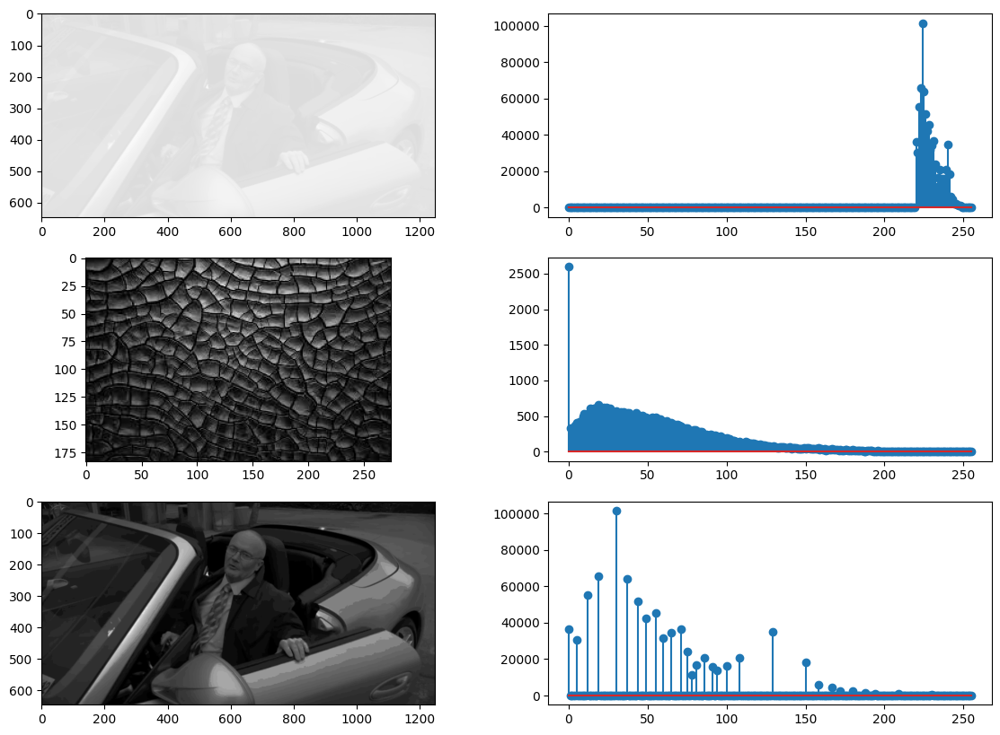

In [131]:
img = cv2.imread("../imgs/Creed.png",cv2.IMREAD_GRAYSCALE)
ref = cv2.imread("../imgs/Texture.jpg",cv2.IMREAD_GRAYSCALE)
pyplot.figure(figsize=[14,10])
pyplot.subplot(3,2,1)
pyplot.imshow(img,cmap="gray",vmin=0,vmax=255)

pyplot.subplot(3, 2, 2)
pyplot.stem(makehist(img))

pyplot.subplot(3, 2, 3)
pyplot.imshow(ref, cmap="gray", vmin=0, vmax=255)

pyplot.subplot(3, 2, 4)
pyplot.stem(makehist(ref))

res = histmatch(img,ref)
pyplot.subplot(3,2,5)
pyplot.imshow(res, cmap="gray", vmin=0, vmax=255)

pyplot.subplot(3, 2, 6)
pyplot.stem(makehist(res))

pyplot.show()


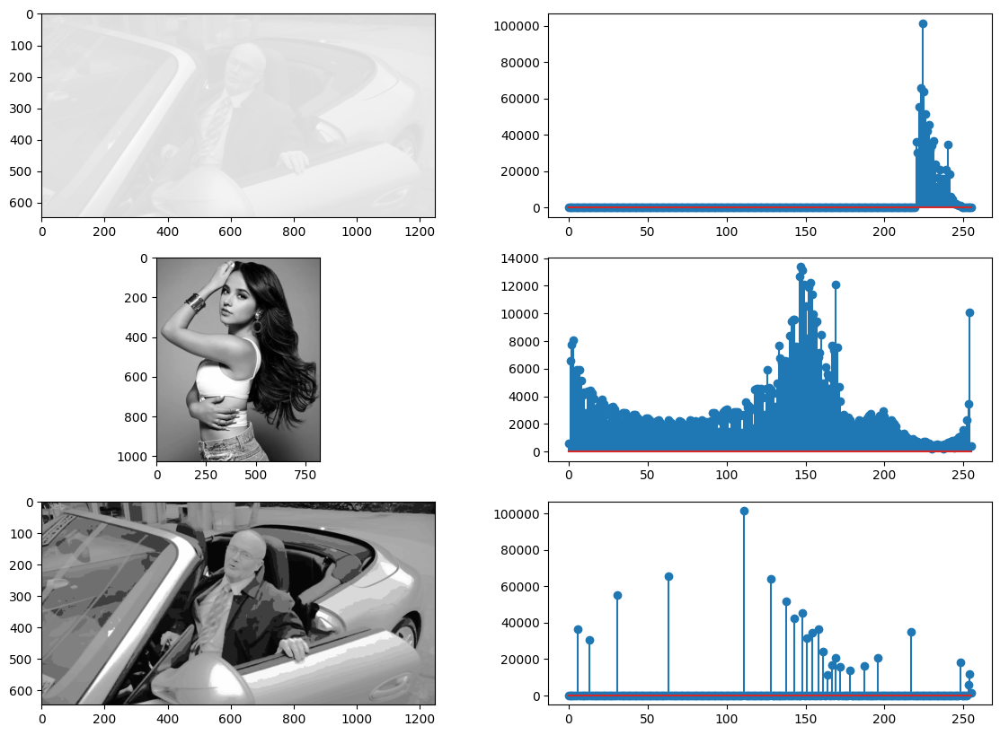

In [132]:
img = cv2.imread("../imgs/Creed.png", cv2.IMREAD_GRAYSCALE)
ref = cv2.imread("../imgs/Naomi.png", cv2.IMREAD_GRAYSCALE)
pyplot.figure(figsize=[14, 10])
pyplot.subplot(3, 2, 1)
pyplot.imshow(img, cmap="gray", vmin=0, vmax=255)

pyplot.subplot(3, 2, 2)
pyplot.stem(makehist(img))

pyplot.subplot(3, 2, 3)
pyplot.imshow(ref, cmap="gray", vmin=0, vmax=255)

pyplot.subplot(3, 2, 4)
pyplot.stem(makehist(ref))

res = histmatch(img, ref)
pyplot.subplot(3, 2, 5)
pyplot.imshow(res, cmap="gray", vmin=0, vmax=255)

pyplot.subplot(3, 2, 6)
pyplot.stem(makehist(res))

pyplot.show()


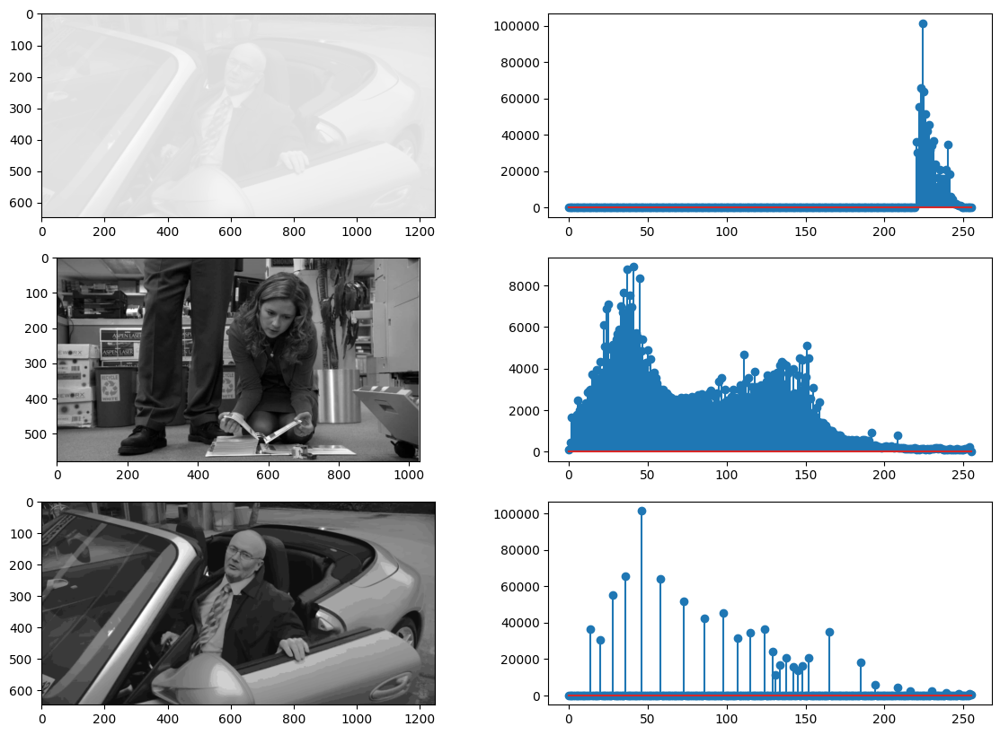

In [133]:
img = cv2.imread("../imgs/Creed.png", cv2.IMREAD_GRAYSCALE)
ref = cv2.imread("../imgs/pam2.png", cv2.IMREAD_GRAYSCALE)
pyplot.figure(figsize=[14, 10])
pyplot.subplot(3, 2, 1)
pyplot.imshow(img, cmap="gray", vmin=0, vmax=255)

pyplot.subplot(3, 2, 2)
pyplot.stem(makehist(img))

pyplot.subplot(3, 2, 3)
pyplot.imshow(ref, cmap="gray", vmin=0, vmax=255)

pyplot.subplot(3, 2, 4)
pyplot.stem(makehist(ref))

res = histmatch(img, ref)
pyplot.subplot(3, 2, 5)
pyplot.imshow(res, cmap="gray", vmin=0, vmax=255)

pyplot.subplot(3, 2, 6)
pyplot.stem(makehist(res))

pyplot.show()


# Q7

### Part 1

In [12]:
def img2mat(img):
    img_mat = np.zeros(img.shape)


    for i in range(0, img.shape[0]):
        row = []
        for j in range(0, img.shape[1]):
            pixel = img.item(i, j)
            row.append(pixel)
        img_mat.append(row)
    return img_mat


In [13]:
def padding(img,k):
    b = np.floor(k/2).astype(int)
    out = np.zeros((img.shape[0]+k-1,img.shape[1]+k-1)).astype(int)
    for x in range(img.shape[0]):
        for y in range(img.shape[1]):
            out[x+b][y+b]=img[x][y]

    return out

In [83]:
def meanfilter(iimg,k):
    kernel = np.ones((k,k))
    kernel = kernel/(k**2)

    img = padding(iimg, k)
    [hei,wid] = np.shape(iimg)
    out = np.zeros(iimg.shape)
    [hk,wk] = np.shape(kernel)
    
    for x in range(k//2 , hei + k//2) :
        for y in range(  k//2 , wid + k//2):
            for i in range(-k//2 , k//2):
                for j in range(-k//2 , k//2):
                    out[x-k//2][y-k//2] += (img[x+i][y+j]*kernel[i+k//2][j+k//2])
    return out.astype(int)


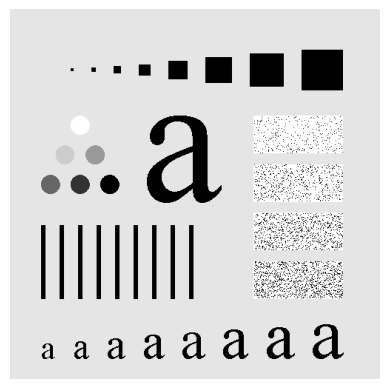

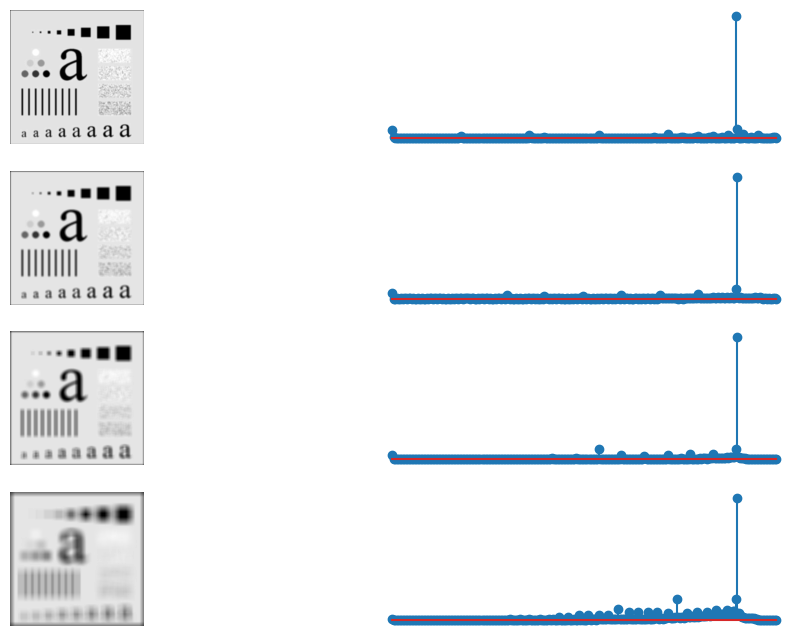

In [84]:
img = cv2.imread("../imgs/testPattern.jpg",cv2.IMREAD_GRAYSCALE)
pyplot.imshow(img,cmap="gray",vmin=0,vmax=255)
pyplot.axis("off")
pyplot.show()
x=1
k = [5,9,15,35]
pyplot.figure(figsize=[12,8])
for i in k:
    res = meanfilter(img,i)
    pyplot.subplot(4,2,x)
    pyplot.imshow(res,cmap="gray",vmin=0,vmax=255)
    pyplot.axis("off")
    x+=1
    pyplot.subplot(4,2,x)
    pyplot.stem(makehist(res))
    pyplot.axis("off")
    x+=1


As the kernel size increases images get more and more blurry.

### Part 7.2

In [33]:
def maxfilter(iimg, k):
    kernel = np.ones((k, k))
    kernel = kernel/(k**2)

    img = padding(iimg, k)
    [hei, wid] = np.shape(iimg)
    out = np.zeros(iimg.shape)
    [hk, wk] = np.shape(kernel)

    for x in range(k//2, hei + k//2):
        for y in range(k//2, wid + k//2):
            
            ma = -1
            for i in range(-k//2, k//2):
                for j in range(-k//2, k//2):
                    ma = max(ma,img[x+i][y+j])
                 
            #print(tmp)
            out[x-k//2][y-k//2] = ma
    return out.astype(int)


In [37]:
def minfilter(iimg, k):
    kernel = np.ones((k, k))
    kernel = kernel/(k**2)

    img = padding(iimg, k)
    [hei, wid] = np.shape(iimg)
    out = np.zeros(iimg.shape)
    [hk, wk] = np.shape(kernel)

    for x in range(k//2, hei + k//2):
        for y in range(k//2, wid + k//2):

            mi = 257
            for i in range(-k//2, k//2):
                for j in range(-k//2, k//2):
                    mi = min(mi, img[x+i][y+j])

            #print(tmp)
            out[x-k//2][y-k//2] = mi
    return out.astype(int)


In [39]:
def medianfilter(iimg, k):
    kernel = np.ones((k, k))
    kernel = kernel/(k**2)

    img = padding(iimg, k)
    [hei, wid] = np.shape(iimg)
    out = np.zeros(iimg.shape)
    [hk, wk] = np.shape(kernel)

    for x in range(k//2, hei + k//2):
        for y in range(k//2, wid + k//2):
            t=0
            tmp = np.zeros((k*k)).astype(int)
            for i in range(-k//2, k//2):     
                for j in range(-k//2, k//2):
                    tmp[t] = (img[x+i][y+j])
                    t+=1
            tmp.sort()
                #print(tmp)
            out[x-k//2][y-k//2] = tmp[(k**2)//2]
    return out.astype(int)


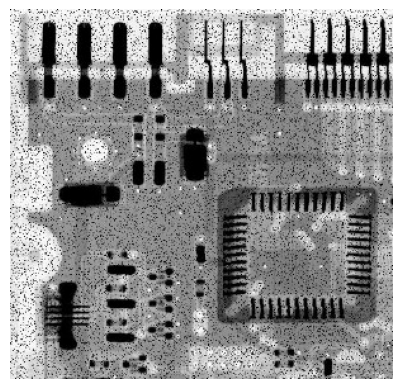

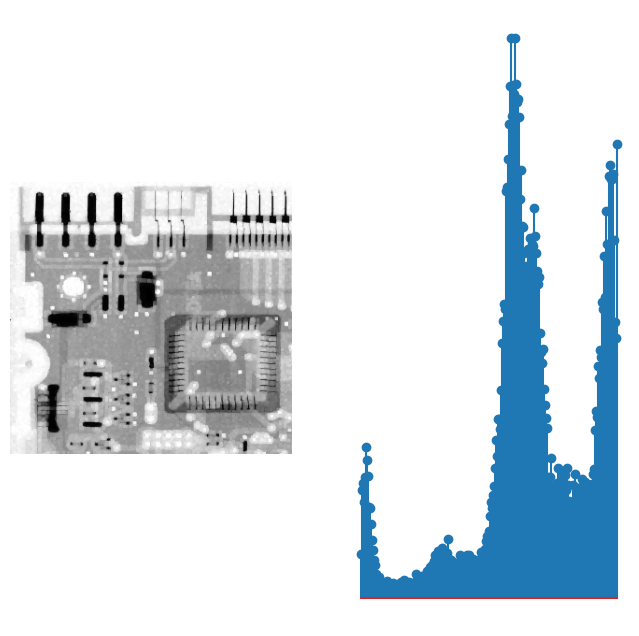

In [44]:
img = cv2.imread("../imgs/noisy1.jpeg", cv2.IMREAD_GRAYSCALE)
pyplot.imshow(img, cmap="gray", vmin=0, vmax=255)
pyplot.axis("off")
pyplot.show()
x = 1
k = [3]
pyplot.figure(figsize=[8, 8])
for i in k:
    res = maxfilter(img, i)
    pyplot.subplot(1, 2, x)
    pyplot.imshow(res, cmap="gray", vmin=0, vmax=255)
    pyplot.axis("off")
    x += 1
    pyplot.subplot(1, 2, x)
    pyplot.stem(makehist(res))
    pyplot.axis("off")
    x += 1


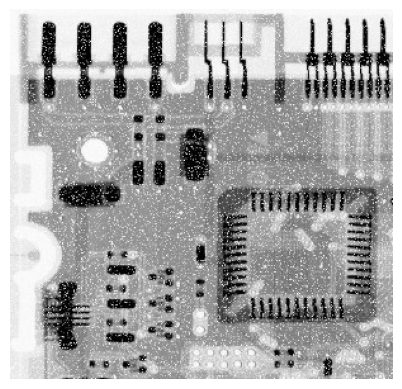

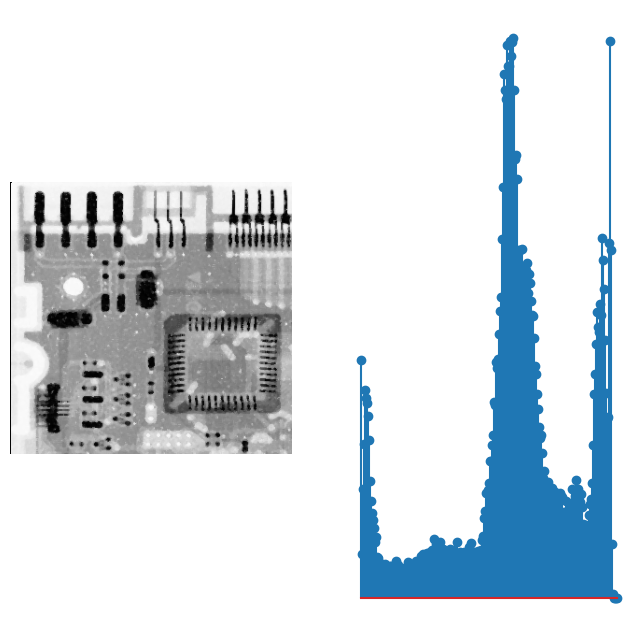

In [45]:
img = cv2.imread("../imgs/noisy2.jpeg", cv2.IMREAD_GRAYSCALE)
pyplot.imshow(img, cmap="gray", vmin=0, vmax=255)
pyplot.axis("off")
pyplot.show()
x = 1
k = [3]
pyplot.figure(figsize=[8, 8])
for i in k:
    res = medianfilter(img, i)
    pyplot.subplot(1, 2, x)
    pyplot.imshow(res, cmap="gray", vmin=0, vmax=255)
    pyplot.axis("off")
    x += 1
    pyplot.subplot(1, 2, x)
    pyplot.stem(makehist(res))
    pyplot.axis("off")
    x += 1


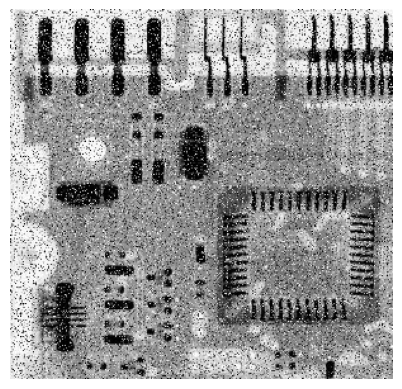

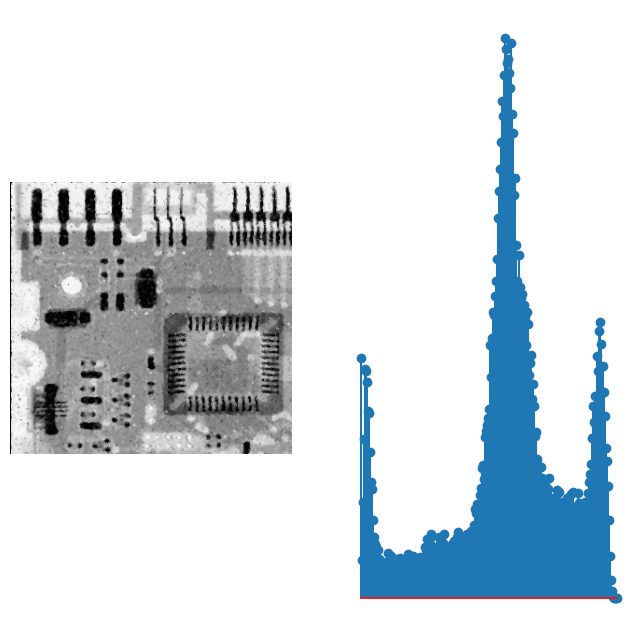

In [46]:
img = cv2.imread("../imgs/noisy3.jpeg", cv2.IMREAD_GRAYSCALE)
pyplot.imshow(img, cmap="gray", vmin=0, vmax=255)
pyplot.axis("off")
pyplot.show()
x = 1
k = [3]
pyplot.figure(figsize=[8, 8])
for i in k:
    res = medianfilter(img, i)
    pyplot.subplot(1,2, x)
    pyplot.imshow(res, cmap="gray", vmin=0, vmax=255)
    pyplot.axis("off")
    x += 1
    pyplot.subplot(1, 2, x)
    pyplot.stem(makehist(res))
    pyplot.axis("off")
    x += 1


## 7.3
### Part 1


In [70]:
def convolution(iimg, kernel):
    [k,r] = kernel.shape
    img = padding(iimg, k)
    [hei, wid] = np.shape(iimg)
    out = np.zeros(iimg.shape)
    [hk, wk] = np.shape(kernel)

    for x in range(k//2, hei + k//2):
        for y in range(k//2, wid + k//2):
            for i in range(-k//2, k//2):
                for j in range(-k//2, k//2):
                    out[x-k//2][y-k//2] += (img[x+i][y+j]
                                            * kernel[i+k//2][j+k//2])
    return out.astype(int)


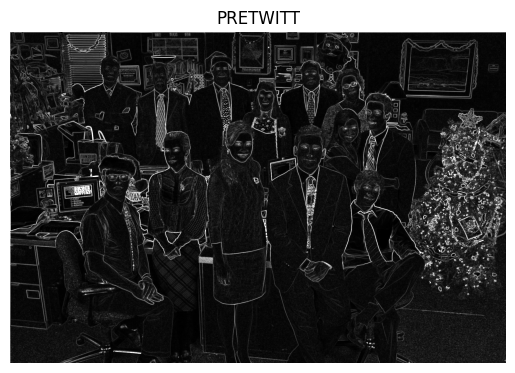

In [73]:
## Prewitt
img = cv2.imread("../imgs/office.jpg",cv2.IMREAD_GRAYSCALE)
kx = np.array([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]])
outputx = convolution(img, kx)



ky = np.array([[1, 1, 1], [0, 0, 0], [-1, -1, -1]])
outputy = convolution(img, ky)



out = np.sqrt(outputx * outputx + outputy * outputy)
out = out.astype(int)

pyplot.imshow(out,cmap="gray",vmin=0,vmax=255)
pyplot.axis("off")
pyplot.title("PREWITT")
pyplot.show()


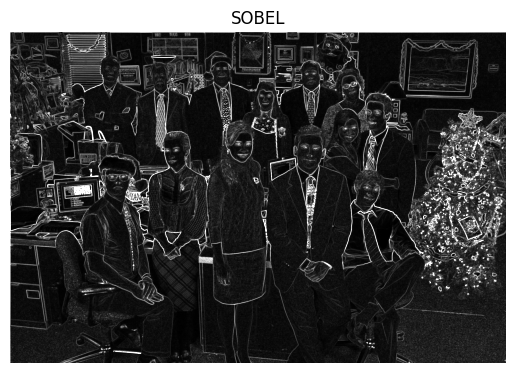

In [76]:
## SOBEL
img = cv2.imread("../imgs/office.jpg", cv2.IMREAD_GRAYSCALE)
kx = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])
outputx = convolution(img, kx)



ky = np.array([[1, 2, 1], [0, 0, 0], [-1, -2, -1]])
outputy = convolution(img, ky)

out = np.sqrt(outputx * outputx + outputy * outputy)
out = out.astype(int)

pyplot.imshow(out, cmap="gray", vmin=0, vmax=255)
pyplot.axis("off")
pyplot.title("SOBEL")
pyplot.show()


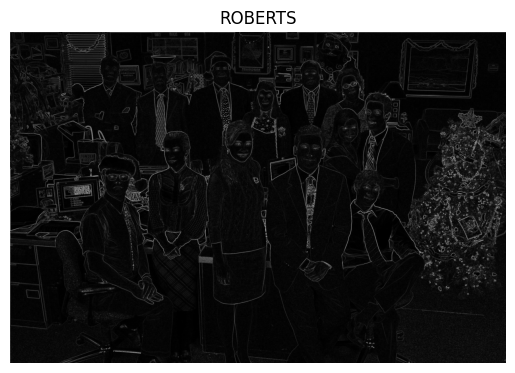

In [75]:
## ROBERTS
img = cv2.imread("../imgs/office.jpg", cv2.IMREAD_GRAYSCALE)
kx = np.array([[0,1], [-1, 0]])
outputx = convolution(img, kx)


ky = np.array([[1,0],[0,-1]])
outputy = convolution(img, ky)

out = np.sqrt(outputx * outputx + outputy * outputy)
out = out.astype(int)

pyplot.imshow(out, cmap="gray", vmin=0, vmax=255)
pyplot.axis("off")
pyplot.title("ROBERTS")
pyplot.show()


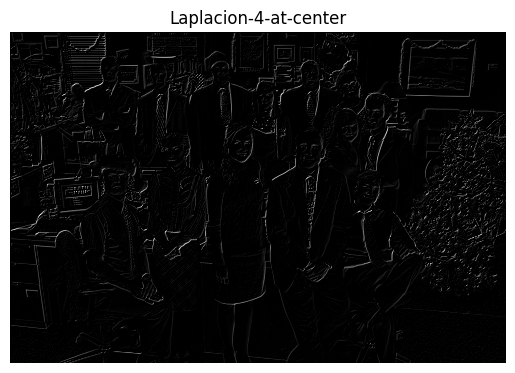

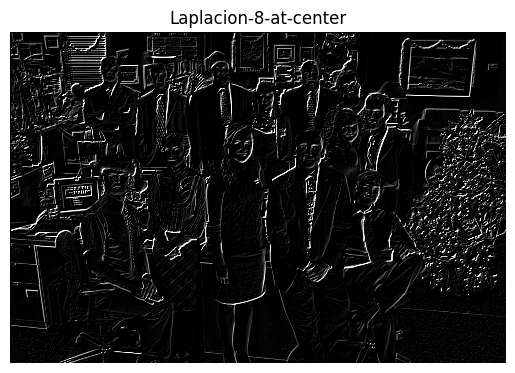

In [137]:
## Laplacian
img = cv2.imread("../imgs/office.jpg", cv2.IMREAD_GRAYSCALE)
kx = np.array([[0, 1, 0], [1, -4, 1], [0, 1, 0]])
output4 = convolution(img, kx).astype(int)
pyplot.imshow(output4, cmap="gray", vmin=0, vmax=255)
pyplot.axis("off")
pyplot.title("Laplacion-4-at-center")
pyplot.show()



ky = np.array([[1, 1, 1], [1, -8, 1], [1, 1, 1]])
output8 = convolution(img, ky).astype(int)

pyplot.imshow(output8, cmap="gray", vmin=0, vmax=255)
pyplot.axis("off")
pyplot.title("Laplacion-8-at-center")
pyplot.show()


Sobel is better in edge detection than Prewitt in terms of sharpness of edge. Roberts takes the least time but is also the worst in the quality of edges. While Laplacian is more sensitive to noise and has darker edges.

# Q8


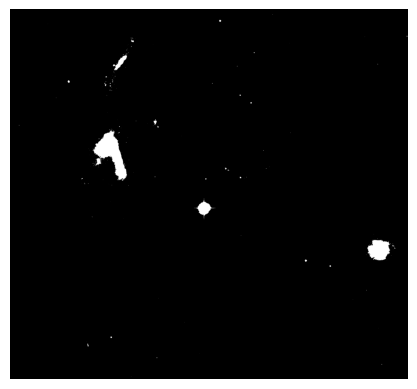

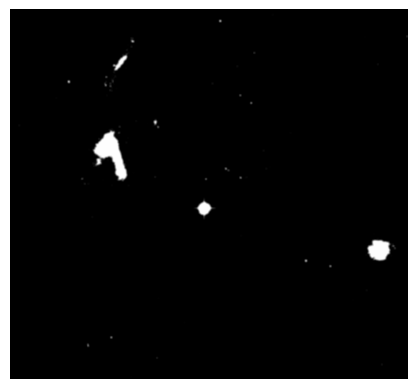

In [86]:
img = cv2.imread("../imgs/galaxies.jpeg",cv2.IMREAD_GRAYSCALE)
pyplot.imshow(img,cmap="gray",vmin=0,vmax=255)

[hei1, wid1] = np.shape(img)
out = np.zeros(img.shape).astype(int)

r = 0
g = 0
b = 0

    # Iterate through each pixel
for x in range(0, hei1):
    for y in range(0, wid1):
            #if(not np.array_equal(img1[x][y],[0,255,0])):
        if (np.linalg.norm([255, 255, 255] - img[x][y]) < 140):
            out[x][y] = 255
out=out[:,:,0]
res = meanfilter(out,35)


[hei, wid] = np.shape(res)

for x in range(0, hei):
    for y in range(0, wid):
        if(res[x][y]>=150) :
            res[x][y]=255
        else:
            res[x][y]=0


pyplot.imshow(res, cmap="gray",vmin=0,vmax=255)
pyplot.axis("off")
pyplot.show()
    
